In [ ]:
# Useful libraries

import cupy as cp # type: ignore
import numpy as np # use this library to use general numpy features
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from matplotlib import rc
rc('animation', html='jshtml')
import matplotlib as mpl
mpl.rcParams['animation.embed_limit'] = 100  # MB

In [75]:
# Constants of the laser

lam = 775e-9 # central wavelength of the pulse in m
wavenumber = 2 * np.pi / lam # central wavenumber of the pulse in m^{-1}
waist = 0.7e-3 # even though the geometry is cartesian, I am still taking the beam waist to be a relevant geomtrical parameter for length scales, in m
zR = wavenumber * waist**2 / 2 # Rayleigh range relevant for the scale of the diffraction in m
tp = 85e-15 # temporal length of the pulse in vacuum in s


# Constants of the material 
nb = 1 # index of refraction of air
n2 = 5.57e-23 # in the optical Kerr effect, in m^{2} W^{-1}
Pcr = lam**2 / (2 * np.pi * nb * n2) # critical power, related to the optical Kerr effect
beta_k = 6.5e-104 # MPA coefficient
Pin = 1.557 * Pcr
K = 7

In [76]:
# Space mesh, frequency mesh

xmin = -5 * waist
xmax = 5 * waist
Nx = 1000
DeltaX = (xmax - xmin) / (Nx - 1)
x_vector = cp.linspace(xmin, xmax, Nx)

kx_vector = 2 * cp.pi * cp.fft.fftfreq(Nx, d=DeltaX)

ymin = -5 * waist
ymax = 5 * waist
Ny = 1000
DeltaY = (ymax - ymin) / (Ny - 1)
y_vector = cp.linspace(ymin, ymax, Ny)

ky_vector = 2 * cp.pi * cp.fft.fftfreq(Ny, d=DeltaY)

zmin = 0
zmax = 4
Nz = 1000
DeltaZ = (zmax - zmin) / (Nz + 1)
z_vector = cp.linspace(zmin, zmax, Nz + 2)

y_matrix, x_matrix = cp.meshgrid(y_vector, x_vector, indexing='ij')

ky_matrix, kx_matrix = cp.meshgrid(ky_vector, kx_vector, indexing='ij')

In [77]:
# Implement Strang splitting (half step, linear FFT, full step, nonlinear E, half step, linear FFT)

In [78]:
# Construct the half propagation matrix A_half for the FFT

A_half = cp.exp(-1j / (2 * wavenumber) * kx_matrix**2 * 0.5 * DeltaZ -1j / (2 * wavenumber) * ky_matrix**2 * 0.5 * DeltaZ) # this is a 2d array

In [79]:
# Initial conditions

amp = np.sqrt(2 * Pin / (np.pi * waist**2)) # this is a number
E = amp * cp.exp(-x_matrix**2 / waist**2 - y_matrix**2 / waist**2).astype(cp.complex128) # this is a 2d array
I = E.real * E.real + E.imag * E.imag # this is a 2d array
I0 = np.nanmax(I) # this is a number

In [ ]:
# Parameters for the diagnostics

number_diag = 10 # each number_diag steps, take a diagnostic
len_diag = (Nz + 1) // number_diag + 1
z_diag = np.array([zmin + m * number_diag * DeltaZ for m in range(len_diag)]) # used for diagnostics

intensity_diag = np.zeros((len_diag, Ny, Nx), dtype=np.float64) # this is a 3d array
intensity_central = np.zeros(len_diag, dtype=np.float64) # this is a 1d array

intensity_diag[0] = cp.asnumpy(I) # this is a 2d array
intensity_central[0] = float(cp.max(I).get()) # this is a number

In [ ]:
# Propagate using Strang splitting

for n in range(1, Nz + 2):
    # do first half step, linear FFT
    spectrum_E = cp.fft.fft2(E)
    spectrum_E = spectrum_E * A_half
    E = cp.fft.ifft2(spectrum_E)
    
    # do second full step, nonlinear E
    I = E.real * E.real + E.imag * E.imag
    Ipow = I**(K-1)
    nonlinear_exp = -0.5 * beta_k * Ipow + 1j * wavenumber * n2 * I
    E = E * cp.exp(nonlinear_exp * DeltaZ)

    # do third half step, linear FFT
    spectrum_E = cp.fft.fft2(E)
    spectrum_E = spectrum_E * A_half
    E = cp.fft.ifft2(spectrum_E)

    if n % number_diag == 0:
        I = E.real * E.real + E.imag * E.imag # this is a 2d array
        I0 = np.nanmax(I) # this is a number
        intensity_diag[n // number_diag] = cp.asnumpy(I)
        intensity_central[n // number_diag] = float(cp.max(I).get())

Text(0, 0.5, 'Central intensity I / I0 (W / m^2)')

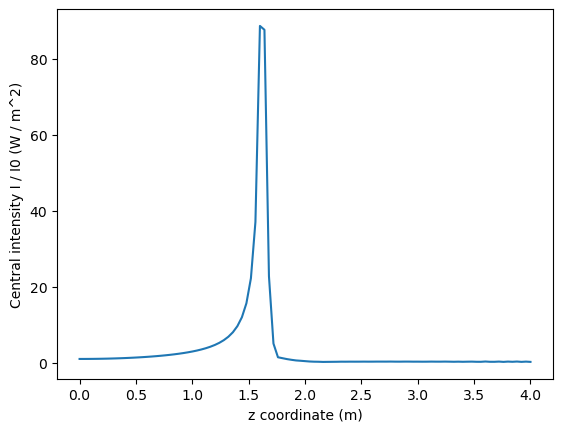

In [82]:
# Plot the diagnostic of intensity_central

plt.plot(z_diag, intensity_central / intensity_central[0])
plt.xlabel('z coordinate (m)')
plt.ylabel('Central intensity I / I0 (W / m^2)')

In [85]:


fig, ax = plt.subplots()

extent = [
    float(x_vector[0].get()), float(x_vector[-1].get()),
    float(y_vector[0].get()), float(y_vector[-1].get())
]


im = ax.imshow(
    intensity_diag[0],
    extent=extent,
    origin='lower',
    aspect='auto',
)

ax.set_xlabel('x (m)')
ax.set_ylabel('y (m)')
ax.set_title('Intensity at z = 0')

cbar = plt.colorbar(im, ax=ax)
cbar.set_label('Intensity')

def animate(i):
    # if intensity_diag is GPU → convert:
    # frame = cp.asnumpy(intensity_diag[i])
    
    frame = intensity_diag[i]
    
    vmin = np.percentile(frame, 1)
    vmax = np.percentile(frame, 100)

    im.set_data(frame)
    im.set_clim(vmin, vmax)
    
    cbar.update_normal(im)
    

    ax.set_title(f'z = {round(z_diag[i], 3)} m')
    return [im]

ani = FuncAnimation(
    fig,
    animate,
    frames=intensity_diag.shape[0],
    interval=100,
    blit=True   # IMPORTANT: safer in notebooks
)

plt.close(fig)
ani